# 🔥 Diffusion Models

In this notebook, we'll walk through the steps required to train your own Diffusion Model on the Oxford flowers dataset

## Table of contents
0. [Parameters](#parameters)
1. [Prepare the Data](#prepare)
2. [Build the Model](#build)
3. [Train the Model](#train)
4. [Generate images](#generate)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-colorblind')

import os
import math
import math

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, Callback, LambdaCallback

import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

from utils.image import display
from utils.datasets import sample_batch

2022-10-14 21:06:04.989139: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-14 21:06:06.051824: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 0. Parameters <a name="parameters"></a>

In [3]:
IMAGE_SIZE = 64
BATCH_SIZE = 64
DATASET_REPETITIONS = 5
LOAD_MODEL = True

NOISE_EMBEDDING_SIZE = 32
PLOT_DIFFUSION_STEPS = 20

# optimization
EMA = 0.999
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
EPOCHS = 50

## 1. Prepare the Data

In [4]:
# Load the data
train_data = keras.utils.image_dataset_from_directory(
    "/app/data/pytorch-challange-flower-dataset/dataset",
    labels=None,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=None,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 8189 files belonging to 1 classes.


2022-10-14 21:06:12.703887: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-14 21:06:12.769490: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-14 21:06:12.770202: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-14 21:06:12.777085: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [5]:
# Preprocess the data
def preprocess(img):
    img = tf.cast(img, "float32") / 255.0
    return img

train = train_data.map(lambda x: preprocess(x))
train = train.repeat(DATASET_REPETITIONS)
train = train.batch(BATCH_SIZE, drop_remainder=True)

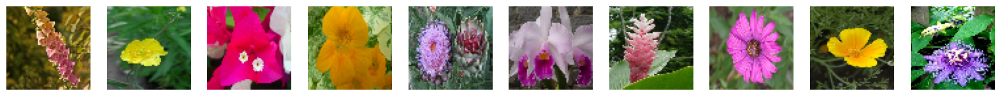

In [6]:
# Show some items of clothing from the training set
train_sample = sample_batch(train)
display(train_sample)

### 1.1 Diffusion schedules <a name="diffusion_schedules"></a>

In [7]:
def linear_diffusion_schedule(diffusion_times):
    min_rate = 0.0001
    max_rate = 0.02
    betas = min_rate + diffusion_times * (max_rate - min_rate)
    alphas = 1 - betas
    alpha_bars = tf.math.cumprod(alphas)
    signal_rates = tf.sqrt(alpha_bars)
    noise_rates = tf.sqrt(1 - alpha_bars)
    return noise_rates, signal_rates

In [8]:
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * math.pi / 2)
    noise_rates = tf.sin(diffusion_times * math.pi / 2)
    return noise_rates, signal_rates

In [9]:
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)
    
    return noise_rates, signal_rates

In [10]:
T = 1000
diffusion_times = tf.convert_to_tensor([x/T for x in range(T)])
linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(diffusion_times)
cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(diffusion_times)
offset_cosine_noise_rates, offset_cosine_signal_rates = offset_cosine_diffusion_schedule(diffusion_times)

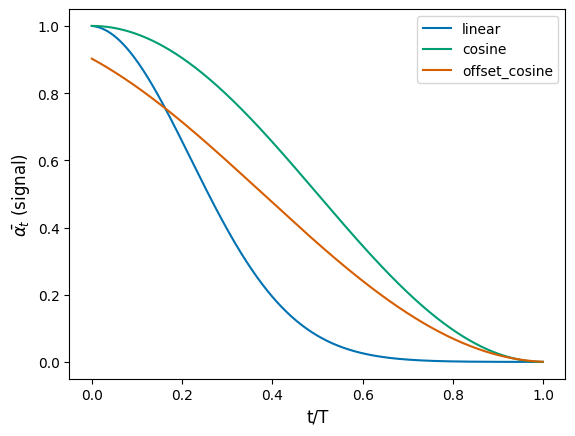

In [11]:
plt.plot(diffusion_times, linear_signal_rates**2,  linewidth=1.5, label='linear')
plt.plot(diffusion_times, cosine_signal_rates**2,  linewidth=1.5, label='cosine')
plt.plot(diffusion_times, offset_cosine_signal_rates**2,  linewidth=1.5, label='offset_cosine')

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r'$\bar{\alpha_t}$ (signal)', fontsize=12)
plt.legend()
plt.show()

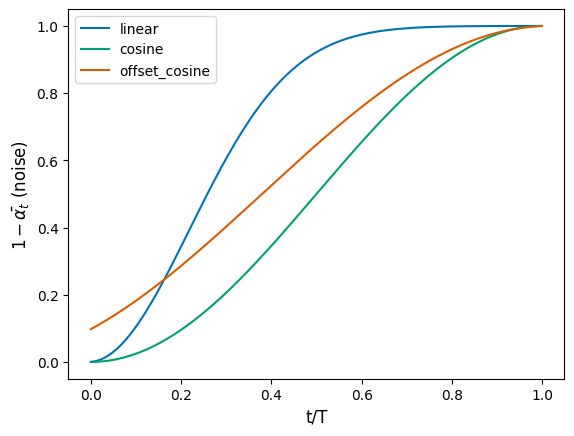

In [12]:
plt.plot(diffusion_times, linear_noise_rates**2,  linewidth=1.5, label='linear')
plt.plot(diffusion_times, cosine_noise_rates**2,  linewidth=1.5, label='cosine')
plt.plot(diffusion_times, offset_cosine_noise_rates**2,  linewidth=1.5, label='offset_cosine')

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r'$1-\bar{\alpha_t}$ (noise)', fontsize=12)
plt.legend()
plt.show()

## 2. Build the model <a name="build"></a>

In [13]:
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            NOISE_EMBEDDING_SIZE // 2,
        )
    )
    angular_speeds = 2.0 * math.pi * frequencies
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings

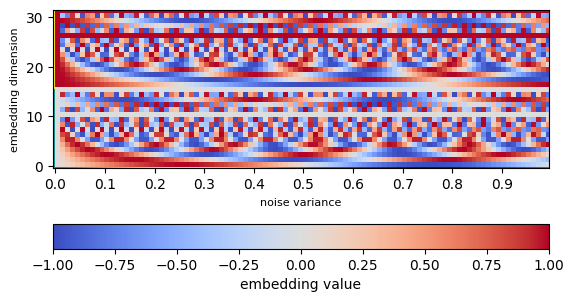

In [14]:
embedding_list = []
for y in np.arange(0,1,0.01):
    embedding_list.append(sinusoidal_embedding(np.array([[[[y]]]]))[0][0][0])
embedding_array = np.array(np.transpose(embedding_list))
fig, ax = plt.subplots()
ax.set_xticks(np.arange(0,100,10), labels=np.round(np.arange(0.0,1.0,0.1),1))
ax.set_ylabel("embedding dimension", fontsize=8)
ax.set_xlabel('noise variance', fontsize=8)
plt.pcolor(embedding_array, cmap='coolwarm')
plt.colorbar(orientation = 'horizontal', label = 'embedding value')
ax.imshow(embedding_array, interpolation='nearest', origin = 'lower')
plt.show()

In [15]:
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = keras.layers.Conv2D(width, kernel_size=1)(x)
        x = keras.layers.BatchNormalization(center=False, scale=False)(x)
        x = keras.layers.Conv2D(
            width, kernel_size=3, padding="same", activation=keras.activations.swish
        )(x)
        x = keras.layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = keras.layers.Add()([x, residual])
        return x

    return apply


def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = keras.layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = keras.layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = keras.layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply

In [16]:
# Build the U-Net

noisy_images = keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = keras.layers.Conv2D(32, kernel_size=1)(noisy_images)

noise_variances = keras.Input(shape=(1, 1, 1))
noise_embedding = keras.layers.Lambda(sinusoidal_embedding)(noise_variances)
noise_embedding = keras.layers.UpSampling2D(size=IMAGE_SIZE, interpolation="nearest")(noise_embedding)

x = keras.layers.Concatenate()([x, noise_embedding])

skips = []

x = DownBlock(32, block_depth = 2)([x, skips])
x = DownBlock(64, block_depth = 2)([x, skips])
x = DownBlock(96, block_depth = 2)([x, skips])

x = ResidualBlock(128)(x)
x = ResidualBlock(128)(x)

x = UpBlock(96, block_depth = 2)([x, skips])
x = UpBlock(64, block_depth = 2)([x, skips])
x = UpBlock(32, block_depth = 2)([x, skips])

x = keras.layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

unet = keras.Model([noisy_images, noise_variances], x, name="unet")

In [17]:
class DiffusionModel(keras.Model):
    def __init__(self):
        super().__init__()

        self.normalizer = keras.layers.Normalization()
        self.network = unet
        self.ema_network = keras.models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = keras.metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denormalize(self, images):
        # convert the pixel values back to 0-1 range
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        # predict noise component and calculate the image component using it
        pred_noises = network([noisy_images, noise_rates**2], training=training)
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps):
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            )
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            current_images = next_signal_rates * pred_images + next_noise_rates * pred_noises    
        return pred_images

    def generate(self, num_images, diffusion_steps):
        # noise -> images -> denormalized images
        initial_noise = tf.random.normal(shape=(num_images, IMAGE_SIZE, IMAGE_SIZE, 3))
        generated_images = self.reverse_diffusion(initial_noise, diffusion_steps)
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))

        # sample uniform random diffusion times
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        
        noisy_images = signal_rates * images + noise_rates * noises
            

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.network.trainable_weights))

        self.noise_loss_tracker.update_state(noise_loss)
        
        # track the exponential moving averages of weights
        for weight, ema_weight in zip(self.network.weights, self.ema_network.weights):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))

        # sample uniform random diffusion times
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        # use the network to separate noisy images to their components
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )

        noise_loss = self.loss(noises, pred_noises)

        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}


In [22]:
model = DiffusionModel()
model.normalizer.adapt(train)

In [19]:
if LOAD_MODEL:
    model.built = True
    model.load_weights('./checkpoint/checkpoint.ckpt')

## 3.Train a Diffusion Model <a name="train"></a>

In [23]:
model.compile(
    optimizer=keras.optimizers.experimental.AdamW(
        learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    ),
    loss=keras.losses.mean_absolute_error,
)

Epoch 1/50


2022-10-14 21:08:28.358880: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f0f40198690 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2022-10-14 21:08:28.358934: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2022-10-14 21:08:28.425721: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2022-10-14 21:08:28.931043: I tensorflow/compiler/jit/xla_compilation_cache.cc:476] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


639/639 [==============================] - ETA: 0s - n_loss: 0.1717
Saved to ./output/generated_img_000.png


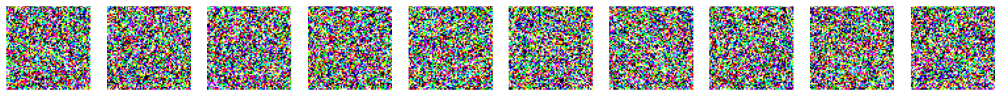

639/639 [==============================] - 151s 204ms/step - n_loss: 0.1717
Epoch 2/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1713
Saved to ./output/generated_img_001.png


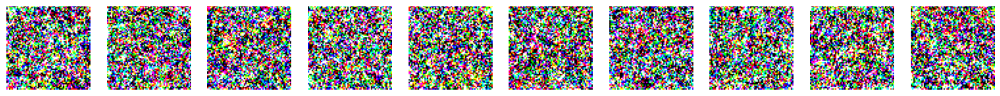

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1713
Epoch 3/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1717
Saved to ./output/generated_img_002.png


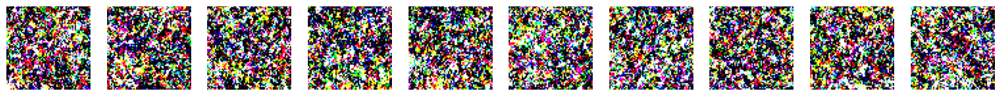

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1717
Epoch 4/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1716
Saved to ./output/generated_img_003.png


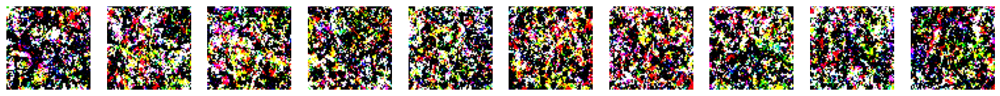

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1716
Epoch 5/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1710
Saved to ./output/generated_img_004.png


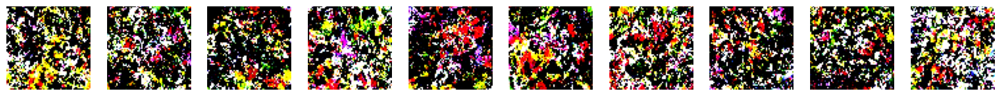

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1710
Epoch 6/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1706
Saved to ./output/generated_img_005.png


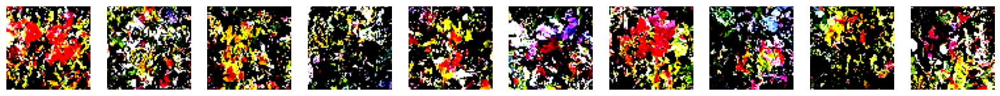

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1706
Epoch 7/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1707
Saved to ./output/generated_img_006.png


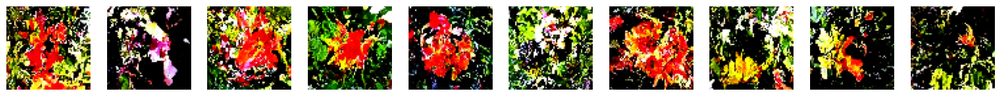

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1707
Epoch 8/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1716
Saved to ./output/generated_img_007.png


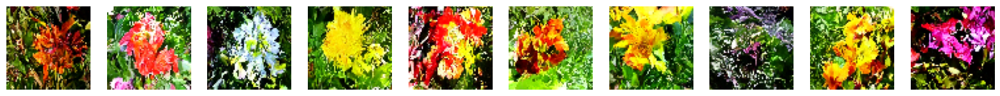

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1716
Epoch 9/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1704
Saved to ./output/generated_img_008.png


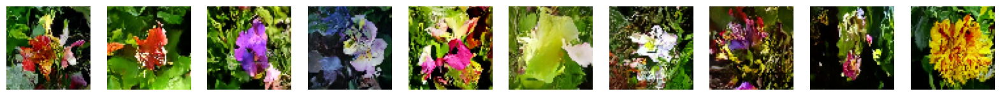

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1704
Epoch 10/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1712
Saved to ./output/generated_img_009.png


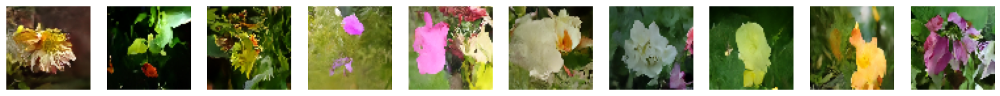

639/639 [==============================] - 131s 203ms/step - n_loss: 0.1712
Epoch 11/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1717
Saved to ./output/generated_img_010.png


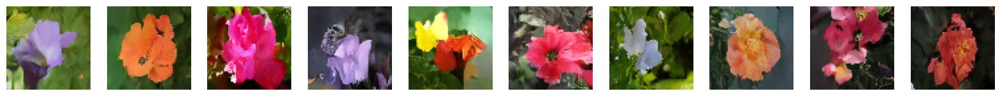

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1717
Epoch 12/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1710
Saved to ./output/generated_img_011.png


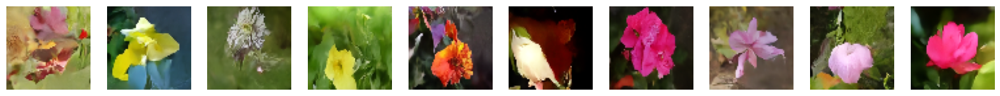

639/639 [==============================] - 129s 202ms/step - n_loss: 0.1710
Epoch 13/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1701
Saved to ./output/generated_img_012.png


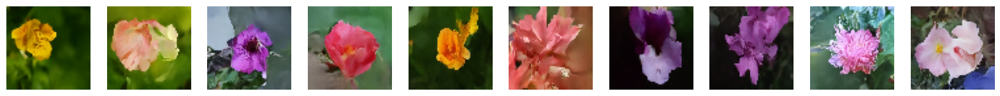

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1701
Epoch 14/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1718
Saved to ./output/generated_img_013.png


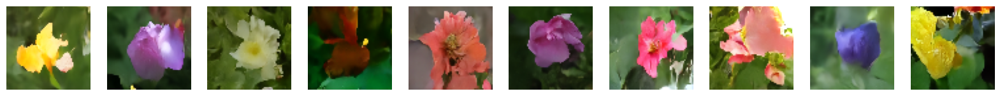

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1718
Epoch 15/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1715
Saved to ./output/generated_img_014.png


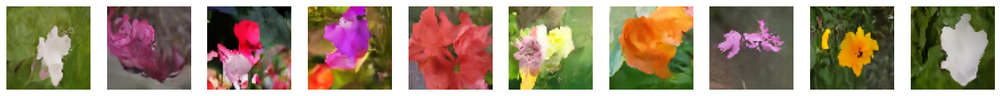

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1715
Epoch 16/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1713
Saved to ./output/generated_img_015.png


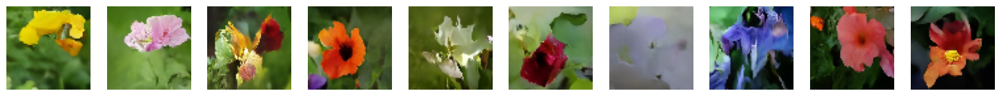

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1713
Epoch 17/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1705
Saved to ./output/generated_img_016.png


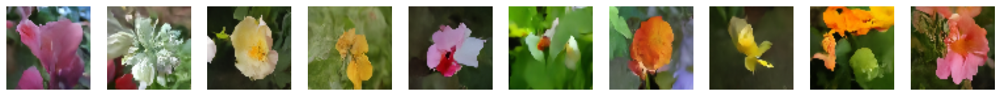

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1705
Epoch 18/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1716
Saved to ./output/generated_img_017.png


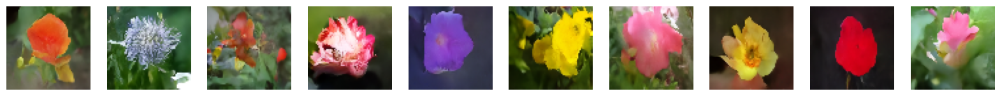

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1716
Epoch 19/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1703
Saved to ./output/generated_img_018.png


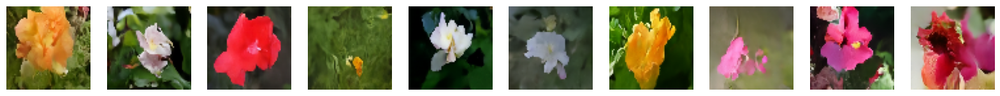

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1703
Epoch 20/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1708
Saved to ./output/generated_img_019.png


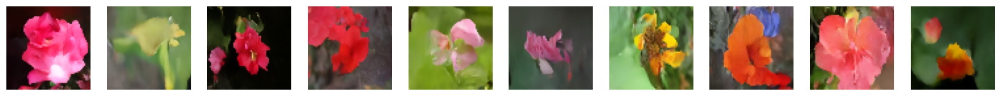

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1708
Epoch 21/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1706
Saved to ./output/generated_img_020.png


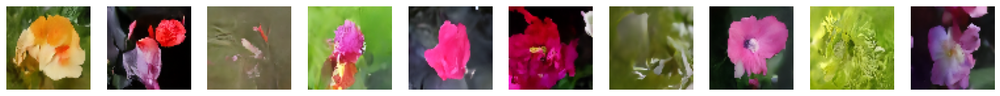

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1706
Epoch 22/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1702
Saved to ./output/generated_img_021.png


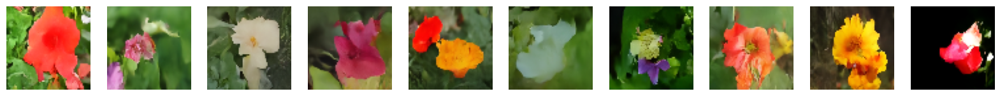

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1702
Epoch 23/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1701
Saved to ./output/generated_img_022.png


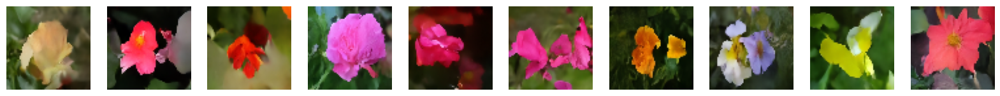

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1701
Epoch 24/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1708
Saved to ./output/generated_img_023.png


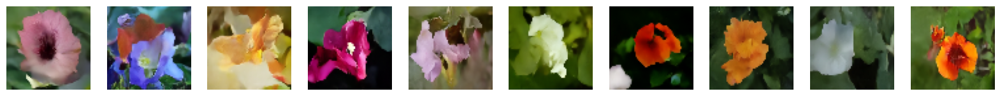

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1708
Epoch 25/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1710
Saved to ./output/generated_img_024.png


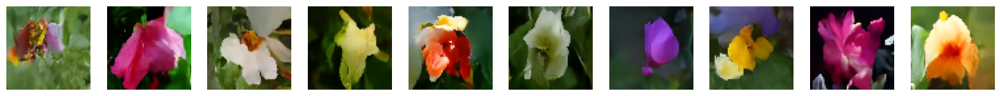

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1710
Epoch 26/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1706
Saved to ./output/generated_img_025.png


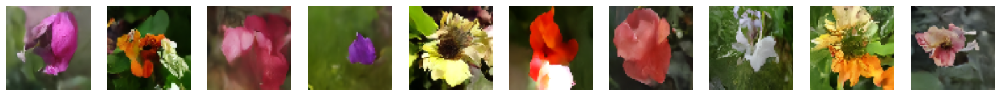

639/639 [==============================] - 129s 202ms/step - n_loss: 0.1706
Epoch 27/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1704
Saved to ./output/generated_img_026.png


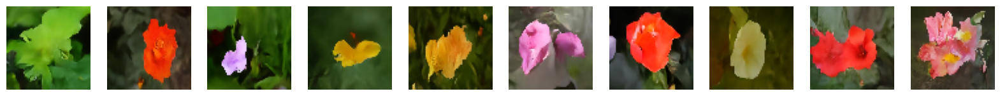

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1704
Epoch 28/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1709
Saved to ./output/generated_img_027.png


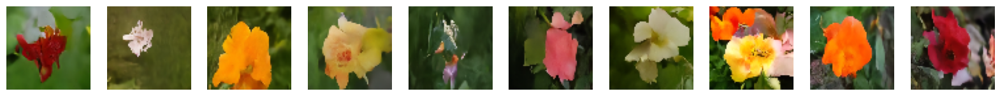

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1709
Epoch 29/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1705
Saved to ./output/generated_img_028.png


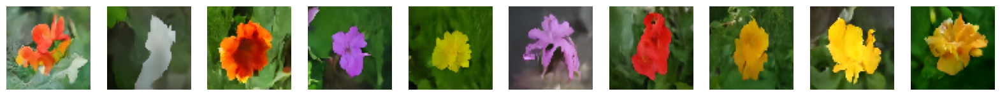

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1705
Epoch 30/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1702
Saved to ./output/generated_img_029.png


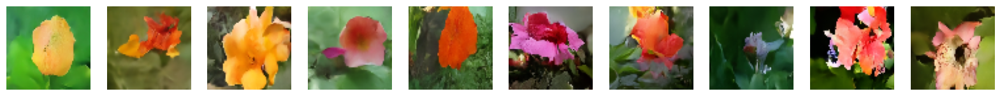

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1702
Epoch 31/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1703
Saved to ./output/generated_img_030.png


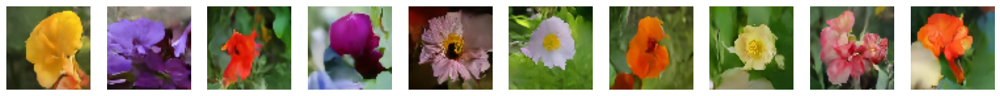

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1703
Epoch 32/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1707
Saved to ./output/generated_img_031.png


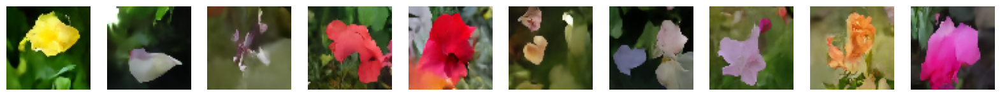

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1707
Epoch 33/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1694
Saved to ./output/generated_img_032.png


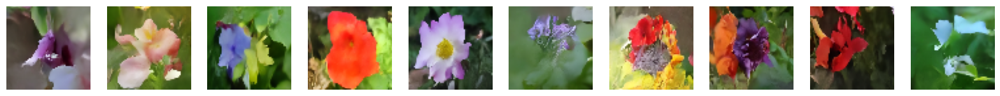

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1694
Epoch 34/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1700
Saved to ./output/generated_img_033.png


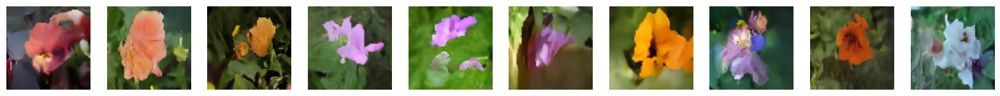

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1700
Epoch 35/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1708
Saved to ./output/generated_img_034.png


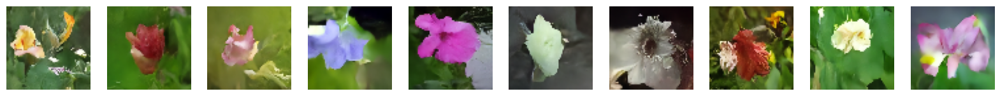

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1708
Epoch 36/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1698
Saved to ./output/generated_img_035.png


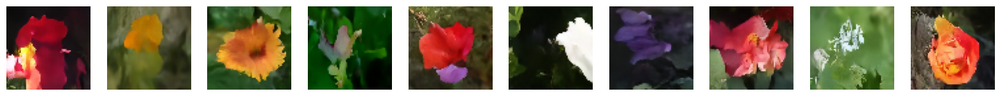

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1698
Epoch 37/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1703
Saved to ./output/generated_img_036.png


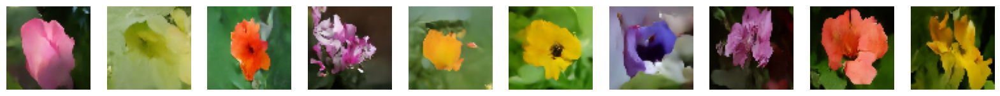

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1703
Epoch 38/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1696
Saved to ./output/generated_img_037.png


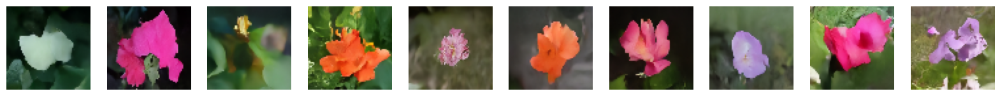

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1696
Epoch 39/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1702
Saved to ./output/generated_img_038.png


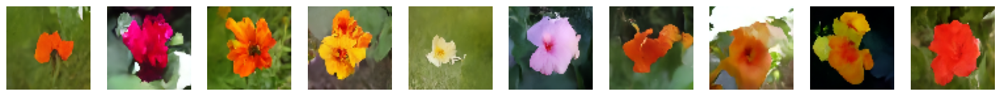

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1702
Epoch 40/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1700
Saved to ./output/generated_img_039.png


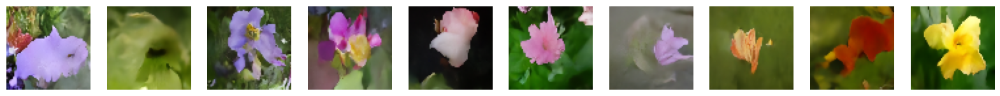

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1700
Epoch 41/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1699
Saved to ./output/generated_img_040.png


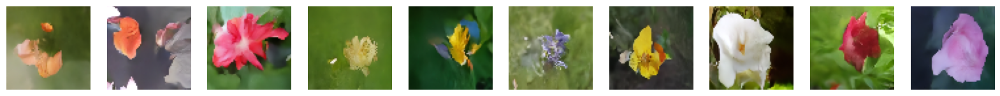

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1699
Epoch 42/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1697
Saved to ./output/generated_img_041.png


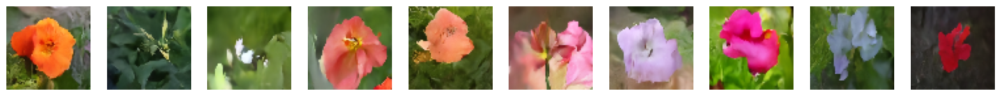

639/639 [==============================] - 130s 201ms/step - n_loss: 0.1697
Epoch 43/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1699
Saved to ./output/generated_img_042.png


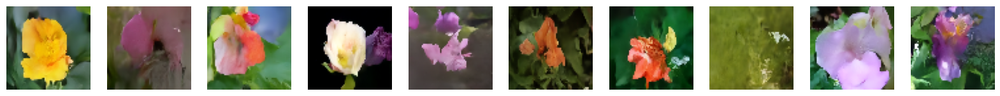

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1699
Epoch 44/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1699
Saved to ./output/generated_img_043.png


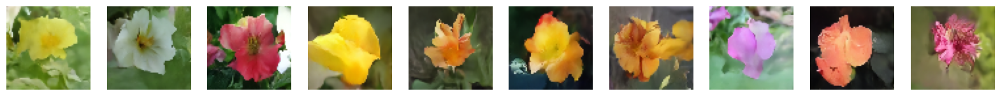

639/639 [==============================] - 130s 202ms/step - n_loss: 0.1699
Epoch 45/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1703
Saved to ./output/generated_img_044.png


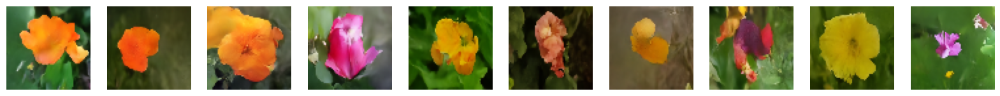

639/639 [==============================] - 129s 200ms/step - n_loss: 0.1703
Epoch 46/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1698
Saved to ./output/generated_img_045.png


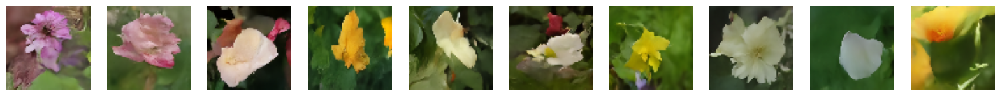

639/639 [==============================] - 130s 203ms/step - n_loss: 0.1698
Epoch 47/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1691
Saved to ./output/generated_img_046.png


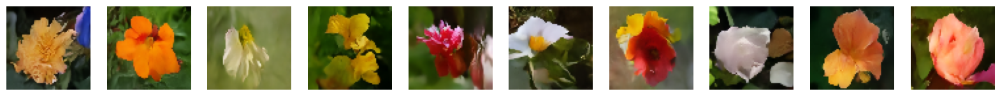

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1691
Epoch 48/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1703
Saved to ./output/generated_img_047.png


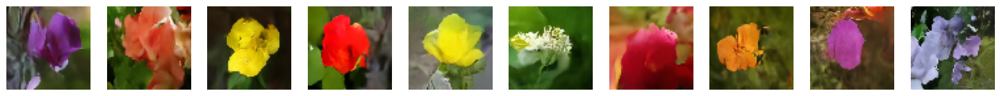

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1703
Epoch 49/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1694
Saved to ./output/generated_img_048.png


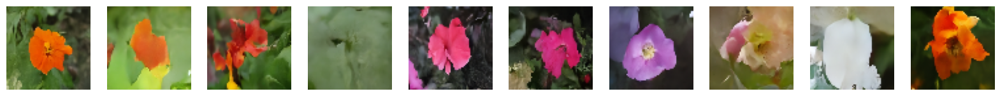

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1694
Epoch 50/50
639/639 [==============================] - ETA: 0s - n_loss: 0.1700
Saved to ./output/generated_img_049.png


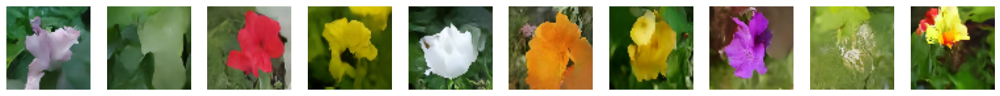

639/639 [==============================] - 129s 201ms/step - n_loss: 0.1700


In [24]:
# run training and plot generated images periodically
model_checkpoint_callback = ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = TensorBoard(log_dir="./logs")

class ImageGenerator(Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        # plot random generated images for visual evaluation of generation quality
        generated_images = self.model.generate(
            num_images=self.num_img
            , diffusion_steps=PLOT_DIFFUSION_STEPS,
        ).numpy()
        display(generated_images, save_to = "./output/generated_img_%03d.png" % (epoch))

image_generator_callback = ImageGenerator(num_img = 10)

model.fit(
    train,
    epochs=EPOCHS,
    callbacks=[model_checkpoint_callback, tensorboard_callback, image_generator_callback],
)

In [26]:
# Save the final models
model.save("./models/unet")

ValueError: Model <__main__.DiffusionModel object at 0x7f14056ce670> cannot be saved either because the input shape is not available or because the forward pass of the model is not defined.To define a forward pass, please override `Model.call()`. To specify an input shape, either call `build(input_shape)` directly, or call the model on actual data using `Model()`, `Model.fit()`, or `Model.predict()`. If you have a custom training step, please make sure to invoke the forward pass in train step through `Model.__call__`, i.e. `model(inputs)`, as opposed to `model.call()`.

## 3. Inference <a name="inference"></a>

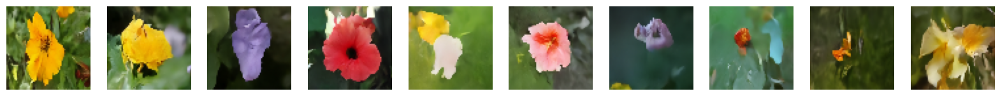

In [25]:
generated_images = model.generate(
    num_images=10
    , diffusion_steps=20,).numpy()
display(generated_images)